<a href="https://colab.research.google.com/github/praveen3599/Plant-Leaf-Disease-Detection/blob/main/Plant_leaf_Disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/data/archive.zip

Streaming output truncated to the last 5000 lines.
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/273a7a9e-18be-4b6a-976a-fa5ffd69b731___RS_HL 4366_90deg.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_90deg.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_new30degFlipLR.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4665.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4665_270deg.JPG  
  inflating: new plant diseases dataset(augmented)/New 

VGG16 Model

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import tensorflow
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob

In [ ]:
image_size = [224, 224]
test = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
train = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

In [ ]:
vgg16 = VGG16(input_shape = image_size + [3], weights = 'imagenet',
             include_top = False)

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
for layer in vgg16.layers:
    layer.trainable = False

In [ ]:
folders = glob ('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/*')

In [ ]:
folders

['/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Soybean___healthy',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Late_blight',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Leaf_Mold',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Target_Spot',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Corn_(maize)___Northern_Leaf_Blight',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Pepper,_bell___healthy',
 '/content/New Plant Diseases Dataset(Augmente

In [ ]:
x = Flatten()(vgg16.output)

In [ ]:
prediction = Dense(len(folders), activation = 'softmax')(x)
model = Model(inputs = vgg16.input, outputs = prediction)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

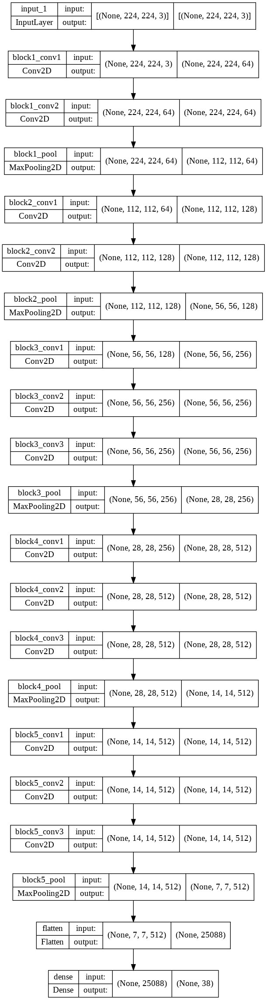

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(loss = 'categorical_crossentropy',
             optimizer = 'adam',
             metrics = ['accuracy'])

In [ ]:
train_data = ImageDataGenerator(rescale = 1./255,
                               shear_range = 0.2,
                               zoom_range = 0.2,
                               horizontal_flip = True)
test_data = ImageDataGenerator(rescale = 1./255)
val_datagen = ImageDataGenerator(preprocessing_function= preprocess_input)

In [ ]:
training_set = train_data.flow_from_directory('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train',
                                             target_size = (224, 224),
                                             batch_size = 32,
                                             class_mode = 'categorical')
val = val_datagen.flow_from_directory(directory="/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
                                          target_size=(224,224),
                                          batch_size=32)

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


In [ ]:

testing_set = test_data.flow_from_directory('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',
                                             target_size = (224, 224),
                                             batch_size = 32,
                                             class_mode = 'categorical')

Found 17572 images belonging to 38 classes.


In [ ]:
training_set.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [ ]:
t_img, label = training_set.next()

In [ ]:
t_img.shape

(32, 224, 224, 3)

In [ ]:
import matplotlib.pyplot as plt
def plotImage(img_arr, label):
  for indx, img in enumerate(img_arr):
    if indx <= 10:
      plt.figure(figsize = (5,5))
      plt.imshow(img)
      plt.title(img.shape)
      plt.axis = False
      plt.show()

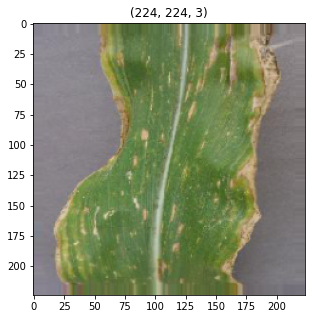

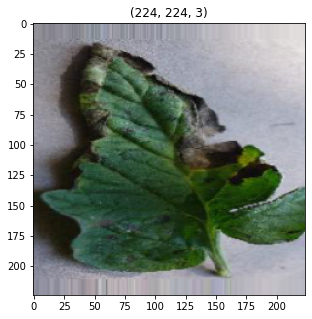

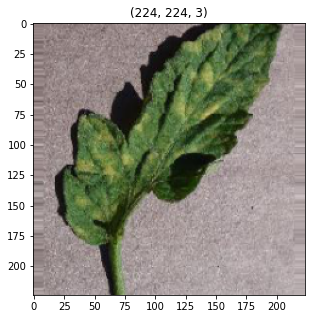

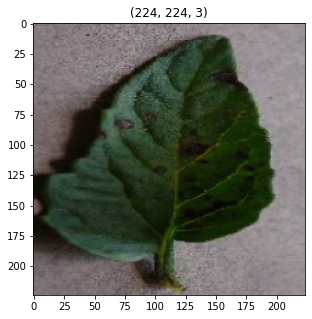

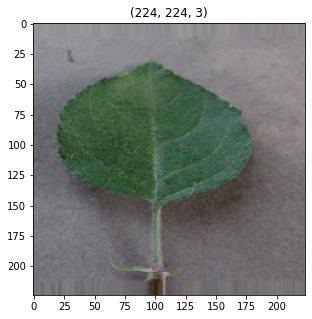

...

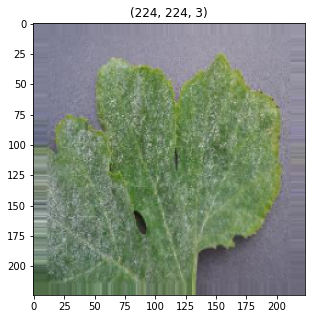

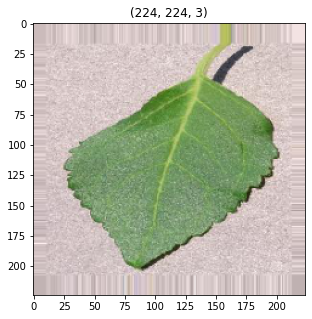

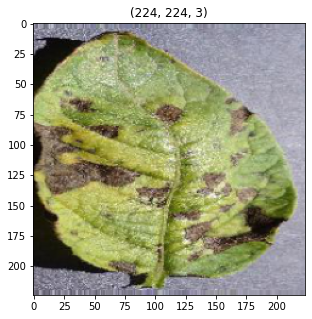

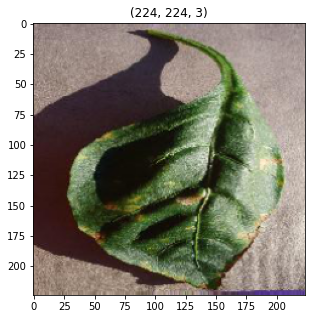

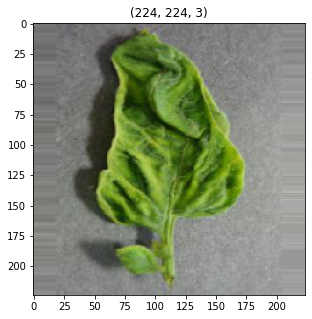

In [ ]:
plotImage(t_img, label)

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

mc = ModelCheckpoint(filepath = "./vgg16_best_model.h5",
                     monitor = 'val_accuracy',
                     verbose = 1,
                     save_best_only = True)
es = EarlyStopping(monitor = 'val_accuracy',
                   min_delta = 0.01,
                   patience = 2,
                   verbose = 1)
cb = [mc, es]

In [ ]:
r = model.fit_generator(training_set,
                        validation_data = testing_set,
                        epochs = 5,
                        steps_per_epoch = len(training_set)//2,
                        validation_steps = len(testing_set)//2,
                        callbacks = cb)

Epoch 1/5
1098/1098 [==============================] - ETA: 0s - loss: 0.7269 - accuracy: 0.7927
Epoch 1: val_accuracy improved from -inf to 0.88364, saving model to ./vgg16_best_model.h5
1098/1098 [==============================] - 540s 480ms/step - loss: 0.7269 - accuracy: 0.7927 - val_loss: 0.3795 - val_accuracy: 0.8836
Epoch 2/5
1098/1098 [==============================] - ETA: 0s - loss: 0.4688 - accuracy: 0.8751
Epoch 2: val_accuracy improved from 0.88364 to 0.89443, saving model to ./vgg16_best_model.h5
1098/1098 [==============================] - 498s 453ms/step - loss: 0.4688 - accuracy: 0.8751 - val_loss: 0.3975 - val_accuracy: 0.8944
Epoch 3/5
1098/1098 [==============================] - ETA: 0s - loss: 0.4031 - accuracy: 0.8989
Epoch 3: val_accuracy did not improve from 0.89443
1098/1098 [==============================] - 492s 448ms/step - loss: 0.4031 - accuracy: 0.8989 - val_loss: 0.4756 - val_accuracy: 0.8906
Epoch 4/5
1098/1098 [==============================] - ETA: 0s

In [ ]:
from keras.models import load_model
model = load_model("/content/vgg16_best_model.h5")

In [ ]:
h = r.history
h.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

No handles with labels found to put in legend.


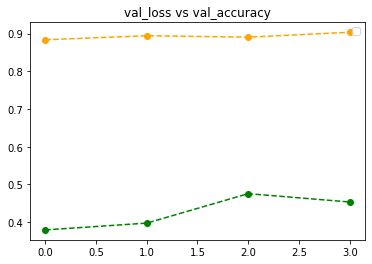

In [ ]:
plt.plot(h['val_loss'],'go--')
plt.plot(h['val_accuracy'],'go--', c = 'orange')
plt.legend()
plt.title('val_loss vs val_accuracy')
plt.show()

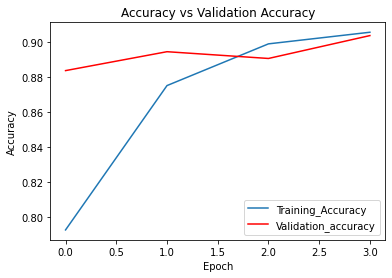

In [ ]:
import matplotlib.pyplot as plt
plt.plot(h['accuracy'],label="Training_Accuracy")
plt.plot(h['val_accuracy'], c="red",label="Validation_accuracy")
plt.title("Accuracy vs Validation Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

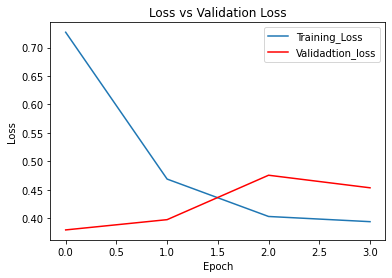

In [ ]:
plt.plot(h['loss'],label="Training_Loss")
plt.plot(h['val_loss'], c="red",label="Validadtion_loss")
plt.title("Loss vs Validation Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
ref = dict(zip(list(training_set.class_indices.values()), list(training_set.class_indices.keys())))

In [ ]:
def prediction(path):

  img = load_img(path,target_size=(224,224))

  i = img_to_array(img)
  im = preprocess_input(i)

  print(im.shape)
  img = np.expand_dims(im, axis= 0)
  
  pred = np.argmax(model.predict(img))
  print(f" The images belongs to  {ref[pred]}")


In [ ]:
test_image = image.load_img("/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/Blueberry___healthy/008c85d0-a954-4127-bd26-861dc8a1e6ff___RS_HL 2431.JPG",
                           target_size = (224, 224))
test_image = image.img_to_array(test_image)
test_image = test_image/255
test_image = np.expand_dims(test_image, axis =0)
result = model.predict(test_image)
result

array([[1.02137530e-13, 6.14889135e-14, 3.67126229e-15, 3.89118601e-14,
        9.99979377e-01, 6.24589977e-18, 4.38132787e-20, 4.11742731e-22,
        3.16936948e-22, 8.90289248e-24, 1.16128535e-29, 1.42323468e-19,
        1.11535903e-20, 1.84123881e-21, 2.90186996e-23, 4.12125942e-08,
        6.62344613e-15, 1.34269662e-15, 3.36104672e-14, 2.75591330e-18,
        9.64821043e-21, 2.18419761e-11, 2.09778679e-12, 1.59397307e-17,
        7.76457631e-12, 4.04287528e-22, 7.95603383e-16, 2.52635136e-21,
        1.33641650e-15, 3.80799559e-12, 2.51171236e-13, 7.24274844e-17,
        1.31942426e-11, 2.06431796e-05, 7.46983897e-09, 9.00676867e-17,
        3.21499283e-13, 9.85101541e-20]], dtype=float32)

In [ ]:
path="/content/test/test/AppleCedarRust2.JPG"
prediction(path)

(224, 224, 3)
 The images belongs to  Cherry_(including_sour)___healthy


VGG19 Model

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import tensorflow
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob

In [ ]:
image_size = [224, 224]
test = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
train = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

In [ ]:
vgg19 = VGG19(input_shape = image_size + [3], weights = 'imagenet',
             include_top = False)

80150528/80134624 [==============================] - 0s 0us/step


In [ ]:
for layer in vgg19.layers:
    layer.trainable = False

In [ ]:
folders = glob ('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/*')

In [ ]:
folders

['/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Soybean___healthy',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Late_blight',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Leaf_Mold',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Target_Spot',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Corn_(maize)___Northern_Leaf_Blight',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Pepper,_bell___healthy',
 '/content/New Plant Diseases Dataset(Augmente

In [ ]:
x = Flatten()(vgg19.output)

In [ ]:
prediction = Dense(len(folders), activation = 'softmax')(x)
model = Model(inputs = vgg19.input, outputs = prediction)

In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

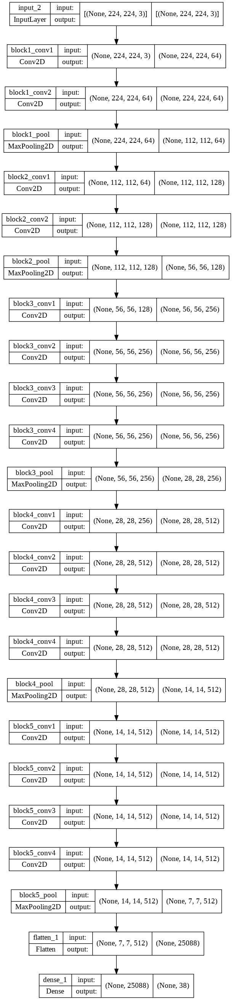

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(loss = 'categorical_crossentropy',
             optimizer = 'adam',
             metrics = ['accuracy'])

In [ ]:
train_data = ImageDataGenerator(rescale = 1./255,
                               shear_range = 0.2,
                               zoom_range = 0.2,
                               horizontal_flip = True)
test_data = ImageDataGenerator(rescale = 1./255)

In [ ]:
training_set = train_data.flow_from_directory('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train',
                                             target_size = (224, 224),
                                             batch_size = 32,
                                             class_mode = 'categorical')
val_datagen = ImageDataGenerator(preprocessing_function= preprocess_input)

Found 70295 images belonging to 38 classes.


In [ ]:
testing_set = test_data.flow_from_directory('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',
                                             target_size = (224, 224),
                                             batch_size = 32,
                                             class_mode = 'categorical')
val = val_datagen.flow_from_directory(directory="/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
                                          target_size=(224,224),
                                          batch_size=32)

Found 17572 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


In [ ]:
training_set.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [ ]:
t_img, label = training_set.next()

In [ ]:
t_img.shape

(32, 224, 224, 3)

In [ ]:
import matplotlib.pyplot as plt
def plotImage(img_arr, label):
  for indx, img in enumerate(img_arr):
    if indx <= 10:
      plt.figure(figsize = (5,5))
      plt.imshow(img)
      plt.title(img.shape)
      plt.axis = False
      plt.show()

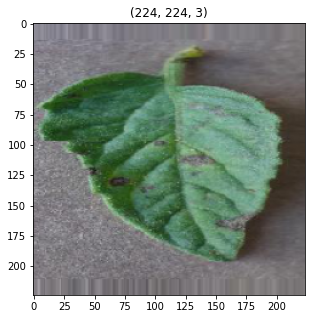

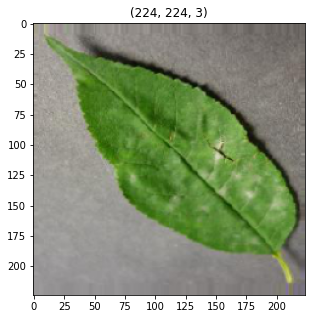

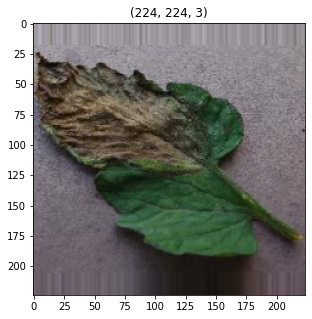

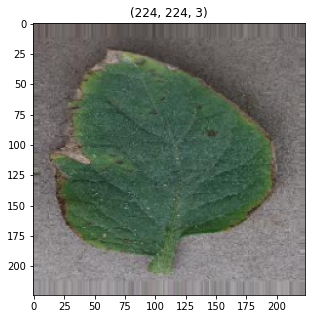

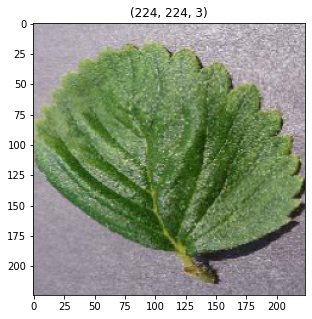

...

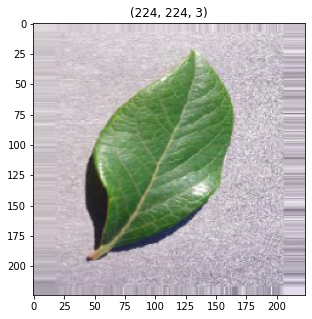

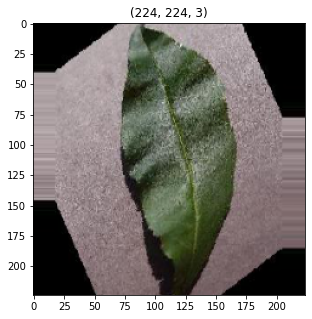

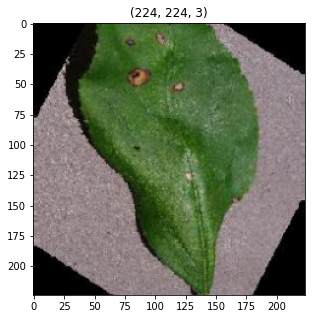

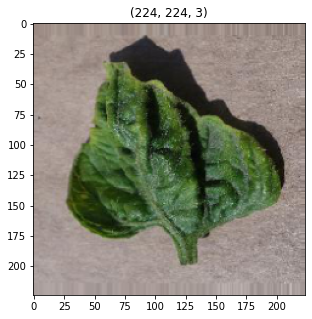

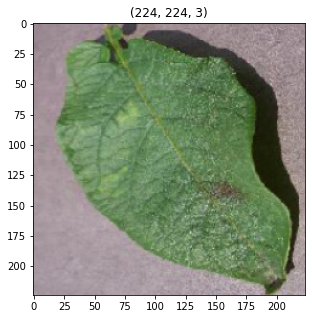

In [ ]:
plotImage(t_img, label)

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

mc = ModelCheckpoint(filepath = "./vgg19_best_model.h5",
                     monitor = 'val_accuracy',
                     verbose = 1,
                     save_best_only = True)
es = EarlyStopping(monitor = 'val_accuracy',
                   min_delta = 0.01,
                   patience = 2,
                   verbose = 1)
cb = [mc, es]

In [ ]:
r = model.fit_generator(training_set,
                        validation_data = testing_set, 
                        epochs = 5,
                        steps_per_epoch = len(training_set)//2,
                        validation_steps = len(testing_set)//2,
                        callbacks = cb)

Epoch 1/5
1098/1098 [==============================] - ETA: 0s - loss: 0.9114 - accuracy: 0.7551
Epoch 1: val_accuracy improved from -inf to 0.86909, saving model to ./vgg19_best_model.h5
1098/1098 [==============================] - 512s 466ms/step - loss: 0.9114 - accuracy: 0.7551 - val_loss: 0.4433 - val_accuracy: 0.8691
Epoch 2/5
1098/1098 [==============================] - ETA: 0s - loss: 0.5989 - accuracy: 0.8495
Epoch 2: val_accuracy did not improve from 0.86909
1098/1098 [==============================] - 509s 464ms/step - loss: 0.5989 - accuracy: 0.8495 - val_loss: 0.5498 - val_accuracy: 0.8677
Epoch 3/5
1098/1098 [==============================] - ETA: 0s - loss: 0.5473 - accuracy: 0.8720
Epoch 3: val_accuracy improved from 0.86909 to 0.88091, saving model to ./vgg19_best_model.h5
1098/1098 [==============================] - 507s 462ms/step - loss: 0.5473 - accuracy: 0.8720 - val_loss: 0.5978 - val_accuracy: 0.8809
Epoch 4/5
1098/1098 [==============================] - ETA: 0s

In [ ]:
from keras.models import load_model
model = load_model("/content/vgg19_best_model.h5")

In [ ]:
h = r.history
h.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

No handles with labels found to put in legend.


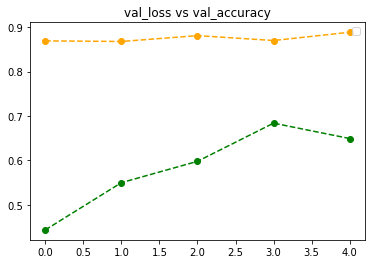

In [ ]:
plt.plot(h['val_loss'],'go--')
plt.plot(h['val_accuracy'],'go--', c = 'orange')
plt.legend()
plt.title('val_loss vs val_accuracy')
plt.show()

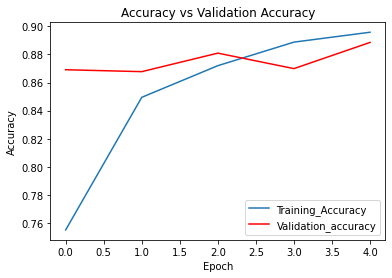

In [ ]:
import matplotlib.pyplot as plt
plt.plot(h['accuracy'],label="Training_Accuracy")
plt.plot(h['val_accuracy'], c="red",label="Validation_accuracy")
plt.title("Accuracy vs Validation Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

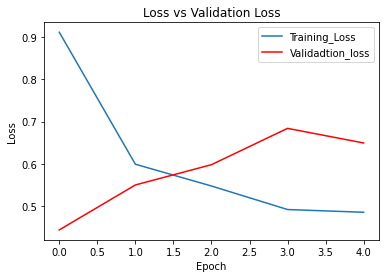

In [ ]:
plt.plot(h['loss'],label="Training_Loss")
plt.plot(h['val_loss'], c="red",label="Validadtion_loss")
plt.title("Loss vs Validation Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
test_image = image.load_img("/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/Blueberry___healthy/008c85d0-a954-4127-bd26-861dc8a1e6ff___RS_HL 2431.JPG",
                           target_size = (224, 224))
test_image = image.img_to_array(test_image)
test_image = test_image/255
test_image = np.expand_dims(test_image, axis =0)
result = model.predict(test_image)
result

array([[2.79297203e-17, 7.37235666e-16, 4.52701093e-25, 7.34854953e-15,
        1.00000000e+00, 1.20431667e-24, 1.74513541e-21, 3.47505670e-27,
        1.32493395e-26, 1.00663104e-26, 1.57238920e-27, 2.30722172e-23,
        7.11375482e-19, 1.08645165e-21, 1.35795640e-22, 1.78643426e-18,
        4.70852116e-22, 6.91162959e-21, 6.84799048e-20, 1.56392301e-14,
        3.91870047e-24, 1.22776089e-16, 3.12791344e-14, 6.08999386e-25,
        7.23994582e-16, 4.31243762e-20, 6.13627216e-21, 3.26106262e-14,
        1.59357883e-19, 2.88358019e-22, 8.33500272e-16, 9.05203390e-19,
        1.97995002e-14, 3.37890688e-11, 4.73960589e-15, 3.46829386e-17,
        1.56101803e-17, 2.66420846e-17]], dtype=float32)

In [ ]:
ref = dict(zip(list(training_set.class_indices.values()), list(training_set    .class_indices.keys())))

In [ ]:
def prediction(path):

  img = load_img(path,target_size=(224,224))

  i = img_to_array(img)
  im = preprocess_input(i)

  print(im.shape)
  img = np.expand_dims(im, axis= 0)
  
  pred = np.argmax(model.predict(img))
  print(f" The images belongs to  {ref[pred]}")


In [ ]:
path="/content/test/test/AppleCedarRust2.JPG"
prediction(path)

(224, 224, 3)
 The images belongs to  Tomato___Septoria_leaf_spot


InceptionV3 Model

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import tensorflow
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob

In [ ]:
image_size = [224, 224]
test = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
train = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

In [ ]:
inception = InceptionV3(input_shape = image_size + [3], weights = 'imagenet',
             include_top = False)

87924736/87910968 [==============================] - 1s 0us/step


In [ ]:
for layer in inception.layers:
    layer.trainable = False

In [ ]:
folders = glob ('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/*')

In [ ]:
folders

['/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Soybean___healthy',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Late_blight',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Leaf_Mold',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Target_Spot',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Corn_(maize)___Northern_Leaf_Blight',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Pepper,_bell___healthy',
 '/content/New Plant Diseases Dataset(Augmente

In [ ]:
x = Flatten()(inception.output)

In [ ]:
prediction = Dense(len(folders), activation = 'softmax')(x)
model = Model(inputs = inception.input, outputs = prediction)

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                           

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(loss = 'categorical_crossentropy',
             optimizer = 'adam',
             metrics = ['accuracy'])

In [ ]:
train_data = ImageDataGenerator(rescale = 1./255,
                               shear_range = 0.2,
                               zoom_range = 0.2,
                               horizontal_flip = True)
test_data = ImageDataGenerator(rescale = 1./255)

val_datagen = ImageDataGenerator(preprocessing_function= preprocess_input)

In [ ]:
training_set = train_data.flow_from_directory('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train',
                                             target_size = (224, 224),
                                             batch_size = 32,
                                             class_mode = 'categorical')
val = val_datagen.flow_from_directory(directory="/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
                                          target_size=(224,224),
                                          batch_size=32)

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


In [ ]:

testing_set = test_data.flow_from_directory('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',
                                             target_size = (224, 224),
                                             batch_size = 32,
                                             class_mode = 'categorical')

Found 17572 images belonging to 38 classes.


In [ ]:
training_set.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [ ]:
t_img, label = training_set.next()

In [ ]:
t_img.shape

(32, 224, 224, 3)

In [ ]:
import matplotlib.pyplot as plt
def plotImage(img_arr, label):
  for indx, img in enumerate(img_arr):
    if indx <= 10:
      plt.figure(figsize = (5,5))
      plt.imshow(img)
      plt.title(img.shape)
      plt.axis = False
      plt.show()

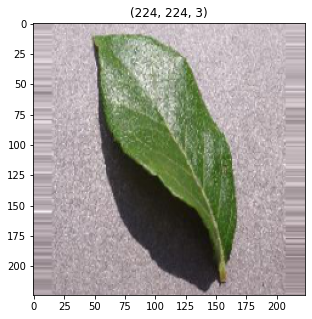

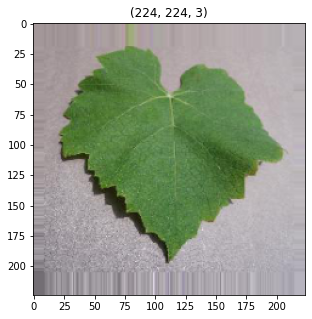

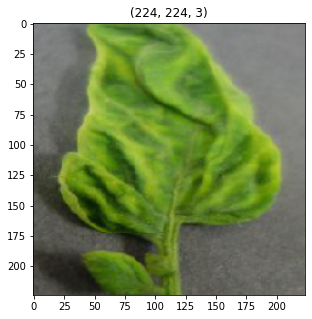

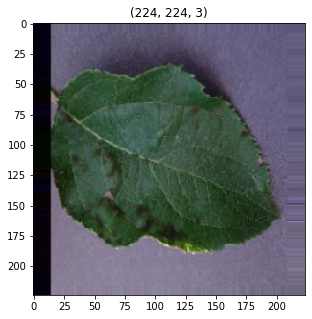

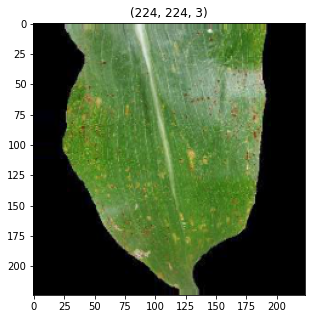

...

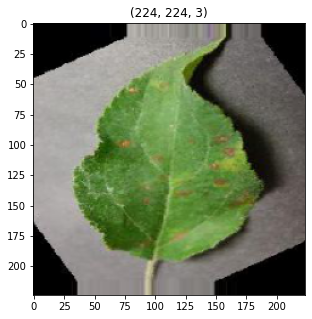

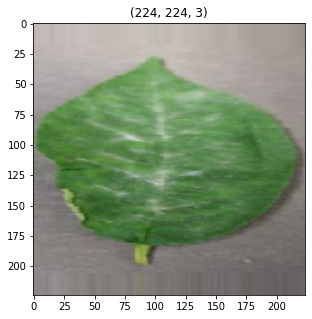

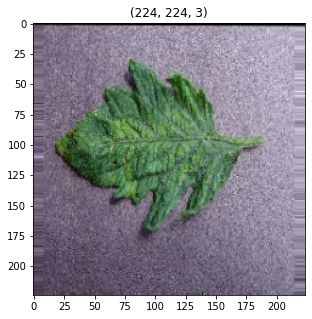

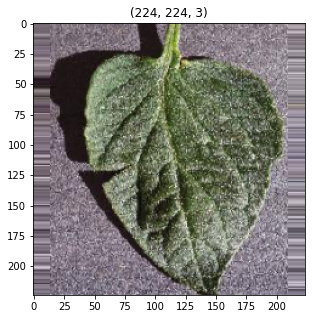

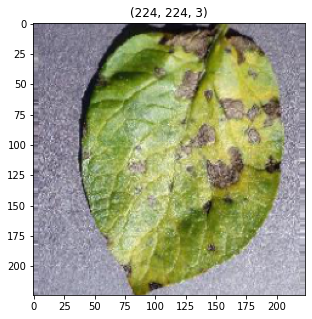

In [ ]:
plotImage(t_img, label)

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

mc = ModelCheckpoint(filepath = "./Inception_best_model.h5",
                     monitor = 'val_accuracy',
                     verbose = 1,
                     save_best_only = True)
es = EarlyStopping(monitor = 'val_accuracy',
                   min_delta = 0.01,
                   patience = 2,
                   verbose = 1)
cb = [mc, es]

In [ ]:
r = model.fit_generator(training_set,
                        validation_data = testing_set,
                        epochs = 5,
                        steps_per_epoch = len(training_set)//2,
                        validation_steps = len(testing_set)//2,
                        callbacks = cb)

Epoch 1/5
1098/1098 [==============================] - ETA: 0s - loss: 3.8935 - accuracy: 0.7396
Epoch 1: val_accuracy improved from -inf to 0.79375, saving model to ./Inception_best_model.h5
1098/1098 [==============================] - 446s 401ms/step - loss: 3.8935 - accuracy: 0.7396 - val_loss: 3.9589 - val_accuracy: 0.7937
Epoch 2/5
1098/1098 [==============================] - ETA: 0s - loss: 3.3593 - accuracy: 0.8352
Epoch 2: val_accuracy improved from 0.79375 to 0.82170, saving model to ./Inception_best_model.h5
1098/1098 [==============================] - 441s 401ms/step - loss: 3.3593 - accuracy: 0.8352 - val_loss: 4.5365 - val_accuracy: 0.8217
Epoch 3/5
1098/1098 [==============================] - ETA: 0s - loss: 3.0352 - accuracy: 0.8681
Epoch 3: val_accuracy improved from 0.82170 to 0.83705, saving model to ./Inception_best_model.h5
1098/1098 [==============================] - 437s 398ms/step - loss: 3.0352 - accuracy: 0.8681 - val_loss: 4.0516 - val_accuracy: 0.8370
Epoch 4

In [ ]:
from keras.models import load_model
model = load_model("/content/Inception_best_model.h5")

In [ ]:
h = r.history
h.keys()

In [ ]:
plt.plot(h['val_loss'],'go--')
plt.plot(h['val_accuracy'],'go--', c = 'orange')
plt.legend()
plt.title('val_loss vs val_accuracy')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.plot(h['accuracy'],label="Training_Accuracy")
plt.plot(h['val_accuracy'], c="red",label="Validation_accuracy")
plt.title("Accuracy vs Validation Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
plt.plot(h['loss'],label="Training_Loss")
plt.plot(h['val_loss'], c="red",label="Validadtion_loss")
plt.title("Loss vs Validation Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
test_image = image.load_img("/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/Blueberry___healthy/008c85d0-a954-4127-bd26-861dc8a1e6ff___RS_HL 2431.JPG",
                           target_size = (224, 224))
test_image = image.img_to_array(test_image)
test_image = test_image/255
test_image = np.expand_dims(test_image, axis =0)
result = model.predict(test_image)
result

In [ ]:
ref = dict(zip(list(training_set.class_indices.values()), list(training_set.class_indices.keys())))

In [ ]:
def prediction(path):

  img = load_img(path,target_size=(224,224))

  i = img_to_array(img)
  im = preprocess_input(i)

  print(im.shape)
  img = np.expand_dims(im, axis= 0)
  
  pred = np.argmax(model.predict(img))
  print(f" The images belongs to  {ref[pred]}")


In [ ]:
path="/content/test/test/AppleCedarRust2.JPG"
prediction(path)

In [ ]:
path = "//content/test/test/TomatoYellowCurlVirus3.JPG"
prediction(path)

In [ ]:
path="/content/test/test/AppleCedarRust2.JPG"
prediction(path)

In [ ]:
path="/content/test/test/AppleScab1.JPG"
prediction(path)

In [ ]:
path="/content/test/test/0ad02171-f9d0-4d0f-bdbd-36ac7674fafc___FAM_B.Msls 4356.JPG"
prediction(path)

Ensembling